# UTSA CS 5243: Assignment-5

**Mao - Christopher - zbq615**

## Learning Objectives

* Epipolar Geometry
* Triangulation
* Stereo Rectification
* Sparse Stereo Reconstruction
* Disparity Map Generation
* Dense Stereo (Point Cloud) Reconstruction

# Stereo Rectification & Sparse Reconstruction (80 points)

Consider that you are given two stereo images. The end goal is to perform **Stereo Rectification & Sparse 3D Reconstruction using Epipolar Geometry**. Following is the overview split into two parts:

* (15 points) Output should be as shown in the example. The input data **MUST** be in the location "/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/sparse-reconstruction/"

**Stereo Rectification**
* (10 points) Given two stereo images, perform feature detection (>8) and matchine. Make sure that the matches are as clean as possible. Also, matches should be spread all over the image and not concentrated in smaller portions of the image.
* (10 points) Use these correspondences to estimate the Fundamental Matrix (F). Use the estimated fundamental matrix to obtain the epipoles and epilines for both left and right images. Draw these epilines on both images.
* (10 points) Using the feature matches and fundamental matrix, perform stereo rectification to obtain updated left and right images are on the same image plane, i.e., there is only translation (no rotation), between the two camera / image centers.
    * (FYI) We can theoretically use the rectified stereo image pair and camera matrices to perform dense stereo reconstruction, which is second part of the assignment. We will skip that step and rather use better / well organized rectified stereo pairs.


**Sparse 3D Reconstruction**
* (10 points) Perform Triangulation - write a function that computes and returns the 3D points when provided with the input - 2 projection matrices and 2 set of corresponding keypoint matches.
* (10 points) Calculate the Essential Matrix (E) using the the fundamental matrix (F) and the provided camera intrinsic matrices (K1 & K2). Compute the Projection matrices (P1 & P2) as follows.
    * extr1 -> rotation (R1) = Identity, translation (T1) = zero. Use extr1 and K1 to obtain the projection matrix of the first camera (P1).
    * (10 points) extr2 -> Use the Essential matrix (E) to predict the extrinsic matrix of the second camera (extr2). There will be 4 estimates of which the one for which most of the projected 3D points are in front of both cameras. Use this extrinsic matrix to obtain the projection matrix of the second camera (P2).
* (05 points) Use the final estimation of the projection matrices P1 & P2 and the feature correspondences, and the corresponding triangulated 3D points as the sparse 3D reconstruction of the image. Plot this as a 3D scatter plot.



Following are some of the functions to search for that will help solve this part of the assignment --
* SIFT_create(), FlannBasedMatcher(), drawKeypoints(), drawMatches(), findFundamentalMat(), computeCorrespondEpilines(), stereoRectifyUncalibrated(), warpPerspective(), np.linalg.svd(), findEssentialMat(), np.matmul(), scatter_3d()

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


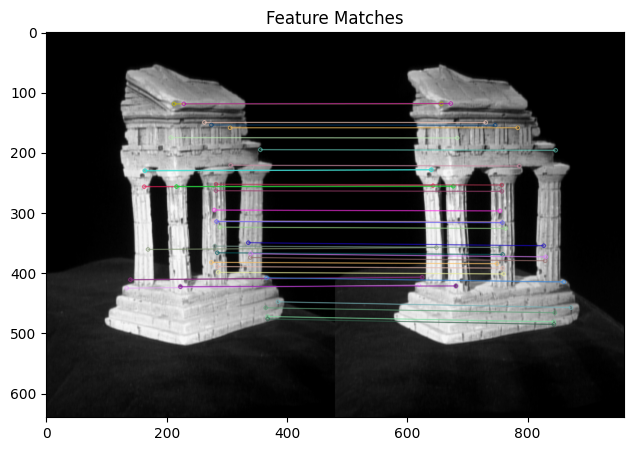

In [ ]:
def detect_and_match_features(img1, img2):
  sift = cv2.SIFT_create()
  kp1, des1 = sift.detectAndCompute(img1, None)
  kp2, des2 = sift.detectAndCompute(img2, None)

  FLANN_INDEX_KDTREE = 0
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k=2)

  # Apply ratio test to filter good matches
  good_matches = []
  for m, n in matches:
    if m.distance < 0.4 * n.distance:
      good_matches.append(m)

  return kp1, kp2, good_matches


# Load the stereo images
img_left = cv2.imread('/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/sparse-reconstruction/stereo_image_1.png',0)
img_right = cv2.imread('/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/sparse-reconstruction/stereo_image_2.png',0)

# Detect and match features
kp1, kp2, matches = detect_and_match_features(img_left, img_right)

# Draw matches
img_matches = cv2.drawMatches(img_left, kp1, img_right, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches
plt.figure(figsize=(15, 5))
plt.imshow(img_matches)
plt.title('Feature Matches')
plt.show()

In [ ]:
print("Length of kp1:", len(kp1))
print("Length of kp2:", len(kp2))
print("Length of matches:", len(matches))

Length of kp1: 935
Length of kp2: 960
Length of matches: 39


In [ ]:
def extract_matching_points(kp1, kp2, matches):
  pts1 = []
  pts2 = []
  for match in matches:
    pts1.append(kp1[match.queryIdx].pt)
    pts2.append(kp2[match.trainIdx].pt)
  pts1 = np.float32(pts1)
  pts2 = np.float32(pts2)
  return pts1, pts2

pts1, pts2 = extract_matching_points(kp1, kp2, matches)
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)

In [ ]:
print(F)


[[ 6.09173452e-06  4.18980937e-04 -9.47135235e-02]
 [-2.60195262e-04 -4.08943192e-05 -6.71257166e-01]
 [ 6.73117008e-02  6.64144689e-01  1.00000000e+00]]


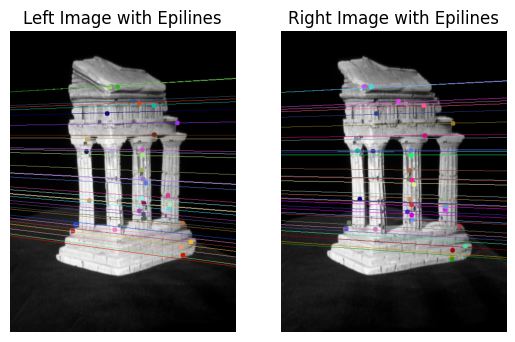

In [ ]:
# Select inlier points
pts_left = pts1[mask.ravel() == 1]
pts_right = pts2[mask.ravel() == 1]

# Compute Epilines (lines in right image for points in left image and vice versa)
lines_right = cv2.computeCorrespondEpilines(pts_left.reshape(-1, 1, 2), 1, F)
lines_right = lines_right.reshape(-1, 3)

lines_left = cv2.computeCorrespondEpilines(pts_right.reshape(-1, 1, 2), 2, F)
lines_left = lines_left.reshape(-1, 3)

# Function to Draw Epilines
def draw_epilines(img, lines, pts):
    r, c = img.shape
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    for r, pt in zip(lines, pts):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [c, -(r[2] + r[0] * c) / r[1]])
        img_color = cv2.line(img_color, (x0, y0), (x1, y1), color, 1)
        img_color = cv2.circle(img_color, tuple(map(int,pt)), 5, color, -1)
    return img_color

# Draw the epilines on both images
img_left_with_epilines = draw_epilines(img_left, lines_right, pts_left)
img_right_with_epilines = draw_epilines(img_right, lines_left, pts_right)

plt.subplot(121), plt.imshow(img_left_with_epilines)
plt.title("Left Image with Epilines"), plt.axis('off')
plt.subplot(122), plt.imshow(img_right_with_epilines)
plt.title("Right Image with Epilines"), plt.axis('off')
plt.show()

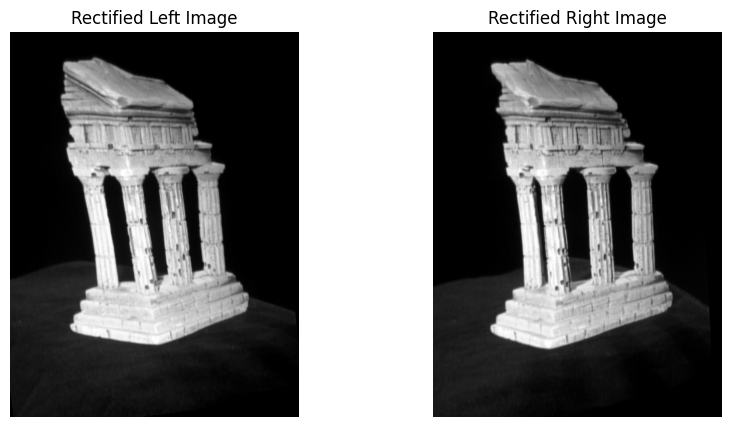

In [ ]:
# Calculate Homographies for Rectification
imgSize = (img_left.shape[1], img_left.shape[0])
_, H_left, H_right = cv2.stereoRectifyUncalibrated(
    points1=pts_left,
    points2=pts_right,
    F=F,
    imgSize=imgSize
)

# Warp the Images Using the Homographies
img_left_rectified = cv2.warpPerspective(img_left, H_left, (img_left.shape[1], img_left.shape[0]))
img_right_rectified = cv2.warpPerspective(img_right, H_right, (img_right.shape[1], img_right.shape[0]))

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(img_left_rectified, cmap='gray')
plt.title("Rectified Left Image"), plt.axis('off')
plt.subplot(122), plt.imshow(img_right_rectified, cmap='gray')
plt.title("Rectified Right Image"), plt.axis('off')
plt.show()


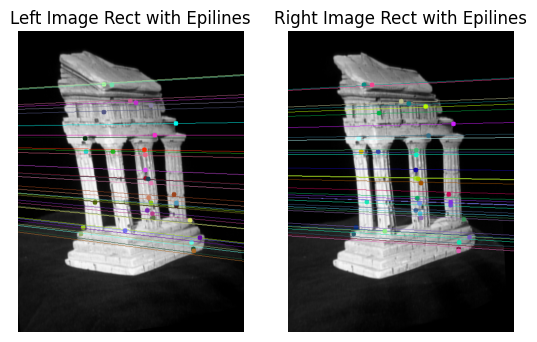

In [ ]:
pts_left_rect = cv2.perspectiveTransform(pts_left.reshape(-1, 1, 2), H_left).reshape(-1, 2)
pts_right_rect = cv2.perspectiveTransform(pts_right.reshape(-1, 1, 2), H_right).reshape(-1, 2)

lines_right_rect = cv2.computeCorrespondEpilines(pts_left_rect.reshape(-1, 1, 2), 1, F)
lines_right_rect = lines_right_rect.reshape(-1, 3)
lines_left_rect = cv2.computeCorrespondEpilines(pts_right_rect.reshape(-1, 1, 2), 2, F)
lines_left_rect = lines_left_rect.reshape(-1, 3)

img_left_rect_epilines = draw_epilines(img_left_rectified, lines_right_rect, pts_left_rect)
img_right_rect_epilines = draw_epilines(img_right_rectified, lines_left_rect, pts_right_rect)

plt.subplot(121), plt.imshow(img_left_rect_epilines)
plt.title("Left Image Rect with Epilines"), plt.axis('off')
plt.subplot(122), plt.imshow(img_right_rect_epilines)
plt.title("Right Image Rect with Epilines"), plt.axis('off')
plt.show()

In [ ]:
img_right.shape

(640, 480)

In [ ]:
print(cv2.stereoRectifyUncalibrated(
    points1=pts_left,
    points2=pts_right,
    F=F,
    imgSize=img_left.shape[:2]
))

(True, array([[ 7.50220748e-01,  5.14142254e-02, -5.22628862e+01],
       [ 5.80774823e-02,  6.70024438e-01, -2.47592757e+01],
       [ 2.18185374e-04,  3.76236894e-05,  5.61998977e-01]]), array([[ 1.16983901e+00,  1.11223653e-02, -5.70178494e+01],
       [ 1.17905976e-01,  1.00116620e+00, -3.80098002e+01],
       [ 5.30888124e-04,  5.04747373e-06,  8.28904407e-01]]))


In [ ]:
# Stereo Rectification Output

In [ ]:
def triangulate_points(P1, P2, points1, points2):
  points3D = cv2.triangulatePoints(P1, P2, points1.T, points2.T)
  points3D = points3D / points3D[3]
  points3D = points3D[:3].T

  return points3D

In [ ]:
# Load the intrinsics data
data = np.load('/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/sparse-reconstruction/intrinsics.npz')

# Access the data using keys
K1 = data['K1']  # Intrinsic matrix for camera 1
K2 = data['K2']  # Intrinsic matrix for camera 2

print("K1:\n", K1)
print("K2:\n", K2)

K1:
 [[1.5204e+03 0.0000e+00 3.0232e+02]
 [0.0000e+00 1.5259e+03 2.4687e+02]
 [0.0000e+00 0.0000e+00 1.0000e+00]]
K2:
 [[1.5204e+03 0.0000e+00 3.0232e+02]
 [0.0000e+00 1.5259e+03 2.4687e+02]
 [0.0000e+00 0.0000e+00 1.0000e+00]]


In [ ]:
E, mask = cv2.findEssentialMat(pts_left_rect, pts_right_rect, cameraMatrix=K1, method=cv2.RANSAC)

In [ ]:
print(E)

[[-5.27727701e-03 -5.09994047e-01 -2.23095677e-02]
 [ 5.04835894e-01 -4.41943166e-03 -4.94620702e-01]
 [ 2.65556051e-02  4.89026317e-01  3.42131914e-04]]


In [ ]:
# Calculate Essential Matrix (E) from Fundamental Matrix (F) and Intrinsic Matrices (K1, K2)
E = np.matmul(np.matmul(K2.T, F), K1)

# Define Extrinsic Matrix for Camera 1 (extr1)
R1 = np.eye(3)  # Identity rotation
T1 = np.zeros((3, 1))  # Zero translation

# Construct Projection Matrix for Camera 1 (P1)
extr1 = np.concatenate((R1, T1), axis=1)
P1 = np.matmul(K1, extr1)

# Estimate Extrinsic Matrix for Camera 2 (extr2) using Essential Matrix (E)
retval, R2, T2, mask = cv2.recoverPose(E, pts_left, pts_right, K1)

# Construct Projection Matrix for Camera 2 (P2)
extr2 = np.concatenate((R2, T2), axis=1)
P2 = np.matmul(K2, extr2)

In [ ]:
U, S, V = np.linalg.svd(E)
print("U:\n", U)
print("S:\n", S)
print("V:\n", V)

U:
 [[-0.61553702 -0.14222926 -0.77516773]
 [ 0.237366   -0.97136614 -0.01025696]
 [-0.75151285 -0.190312    0.63167221]]
S:
 [1.55092225e+03 1.29520114e+03 1.07359694e-13]
V:
 [[-0.10159993 -0.97760686 -0.18428859]
 [ 0.4500741  -0.2103746   0.86785704]
 [ 0.88719263 -0.00523069 -0.46136957]]


In [ ]:
# Assuming E is your Essential Matrix
# U, S, V = np.linalg.svd(E)

# We need to find 4 possible values for P2, based on the SVD of E.
# We can generate 4 possible rotation matrices R2 and translation vectors T2
W = np.array([[0, -1, 0], [1, 0, 0], [0, 0, 1]])

R2_1 = np.matmul(np.matmul(U, W), V)
T2_1 = U[:, 2]

R2_2 = np.matmul(np.matmul(U, W), V)
T2_2 = -U[:, 2]

R2_3 = np.matmul(np.matmul(U, W.T), V)
T2_3 = U[:, 2]

R2_4 = np.matmul(np.matmul(U, W.T), V)
T2_4 = -U[:, 2]

# Now, you have 4 possible combinations of R2 and T2
possible_P2 = []

extr2_1 = np.concatenate((R2_1, T2_1.reshape(3, 1)), axis=1)
P2_1 = np.matmul(K2, extr2_1)
possible_P2.append(P2_1)

extr2_2 = np.concatenate((R2_2, T2_2.reshape(3, 1)), axis=1)
P2_2 = np.matmul(K2, extr2_2)
possible_P2.append(P2_2)

extr2_3 = np.concatenate((R2_3, T2_3.reshape(3, 1)), axis=1)
P2_3 = np.matmul(K2, extr2_3)
possible_P2.append(P2_3)

extr2_4 = np.concatenate((R2_4, T2_4.reshape(3, 1)), axis=1)
P2_4 = np.matmul(K2, extr2_4)
possible_P2.append(P2_4)

print("Possible P2 matrices:")
for i, p2 in enumerate(possible_P2):
    print(f"P2_{i+1}:\n{p2}")

Possible P2 matrices:
P2_1:
[[-3.24910371e+02  2.81372645e+01  1.51547190e+03 -9.87597881e+02]
 [ 2.00314735e+02  1.53137978e+03  6.37618125e+01  1.40289821e+02]
 [ 9.17987081e-01  2.46470204e-02  3.95843712e-01  6.31672208e-01]]
P2_2:
[[-3.24910371e+02  2.81372645e+01  1.51547190e+03  9.87597881e+02]
 [ 2.00314735e+02  1.53137978e+03  6.37618125e+01 -1.40289821e+02]
 [ 9.17987081e-01  2.46470204e-02  3.95843712e-01 -6.31672208e-01]]
P2_3:
[[-1.42746875e+03 -1.78056240e+01 -6.04176686e+02 -9.87597881e+02]
 [ 4.86134546e+01 -1.53284741e+03 -1.93212720e+02  1.40289821e+02]
 [ 2.02842774e-01 -3.12551858e-02 -9.78712380e-01  6.31672208e-01]]
P2_4:
[[-1.42746875e+03 -1.78056240e+01 -6.04176686e+02  9.87597881e+02]
 [ 4.86134546e+01 -1.53284741e+03 -1.93212720e+02 -1.40289821e+02]
 [ 2.02842774e-01 -3.12551858e-02 -9.78712380e-01 -6.31672208e-01]]


In [ ]:
print(E)
print(P1)
print(P2)

[[ 1.40817520e+01  9.72026706e+02  1.60583940e+01]
 [-6.03647376e+02 -9.52171390e+01 -1.15970686e+03]
 [ 7.47877118e+00  1.19129367e+03  8.75264747e-01]]
[[1.5204e+03 0.0000e+00 3.0232e+02 0.0000e+00]
 [0.0000e+00 1.5259e+03 2.4687e+02 0.0000e+00]
 [0.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00]]
[[ 1.42746875e+03  1.78056240e+01  6.04176686e+02 -9.87597881e+02]
 [-4.86134546e+01  1.53284741e+03  1.93212720e+02  1.40289821e+02]
 [-2.02842774e-01  3.12551858e-02  9.78712380e-01  6.31672208e-01]]


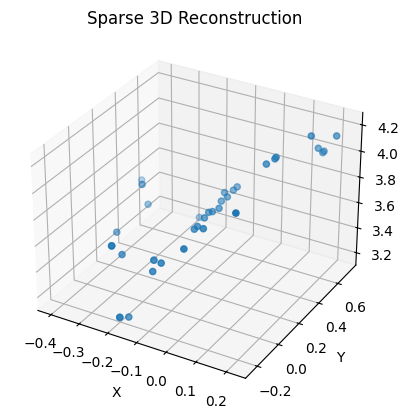

In [ ]:
# Triangulate the 3D points
points3D = triangulate_points(P1, P2, pts_left, pts_right)

# Plot the 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points3D[:, 0], points3D[:, 1], points3D[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Sparse 3D Reconstruction')
plt.show()

In [ ]:
import plotly.graph_objects as go

# Assuming you have your points3D calculated as 'points3D'
# points3D should be a NumPy array with shape (N, 3), where N is the number of points

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=points3D[:, 0],
    y=points3D[:, 1],
    z=points3D[:, 2],
    mode='markers',
    marker=dict(
        size=4,
        color=points3D[:, 2],  # Set color to an array/list of desired values
        colorscale='Viridis',  # Choose a colorscale
        opacity=0.8
    )
)])

# Customize the layout
fig.update_layout(
    title='3D Scatter Plot of Sparse Reconstruction',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

# Show the plot
fig.show()

In [ ]:
# Prints of Matrices Computed - Fundamental, Intrinsic, Essential, Projection

In [ ]:
# Sparse Reconstruction Output

# Dense Stereo Reconstruction (70 points)

To obtain the 3D point cloud, a depth value for the each pixel location is obtained by perform **Dense 3D Reconstruction** on Rectified Stereo Image Pair. Following is the overview of the dense 3D reconstruction process, given a pair of rectified stereo image pairs and calibration parameters.

* (10 points) Read the rectified images, left and right, from one of the dataset folder within the base folder path "/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/". Read the calibration file to extract the camera intrinsic matrix, focal length, and baseline.
* (10 points) Compute the left and right disparity images from the grayscale stereo images. Compare it with the provided disparity images. You can use the StereoBM (Stereo Block Matching) algorithm from OpenCV. You will need to adjust the two parameters (number-of-disparities & block-size) for each stereo dataset to obtain the best results.
* (20 points) Commpute the Point Cloud using the left image, left disparity, and the given calibration parameteres. Save the output point cloud as .ply. This .ply file can be downloaded and opened in MeshLab (or other such tools) for visualization. You **MUST** submit the .ply files as part of your submission.
* (10 points) Reproject the 3D point cloud to 2D image and compare that to the original left image.
* (20 points) Run the above approach of 4 stereo pairs provided. These are extracted for the Middlebury 2021 Stereo Dataset. Refer to this site for more information - https://vision.middlebury.edu/stereo/data/scenes2021/ . Output **MUST** be exactly as shown in the examples.



Following are some of the functions to search for that will help solve this part of the assignment --
* StereoBM_create(), stereoRectify(), reprojectImageTo3D(), projectPoints()

### Step 1: Read the rectified images, left and right, from one of the dataset folder within the base folder path "/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/". Read the calibration file to extract the camera intrinsic matrix, focal length, and baseline.

In [209]:
def load_images_and_calibration(left_img_path, right_img_path, calib_path):
    """
    Load rectified stereo images and parse calibration data from a text file.

    Parameters:
        left_img_path (str): Path to the left rectified image.
        right_img_path (str): Path to the right rectified image.
        calib_path (str): Path to the calibration text file.

    Returns:
        tuple: left_img, right_img, K (camera matrix), baseline (float),
               focal length (float), principal point (tuple).
    """
    # Load the rectified images
    left_img = cv2.imread(left_img_path, cv2.IMREAD_GRAYSCALE)
    right_img = cv2.imread(right_img_path, cv2.IMREAD_GRAYSCALE)

    # Load the calibration data
    with open(calib_path, 'r') as f:
        file_contents = f.read()

    # Parse calibration data
    lines = file_contents.split('\n')
    K = None
    baseline = None

    for line in lines:
        if line.startswith('cam0'):
            # Extract camera matrix (in the form [f 0 cx; 0 f cy; 0 0 1])
            matrix_str = line.split('=')[1].strip().replace('[', '').replace(']', '').replace(';', '')
            numbers = matrix_str.split()
            K = np.array([
                [float(numbers[0]), float(numbers[1]), float(numbers[2])],
                [float(numbers[3]), float(numbers[4]), float(numbers[5])],
                [float(numbers[6]), float(numbers[7]), float(numbers[8])]
            ])
        elif line.startswith('baseline'):
            # Extract baseline
            baseline = float(line.split('=')[1].strip())

    # Extract focal length and principal point from the camera matrix
    if K is not None:
        f = K[0, 0]
        cx, cy = K[0, 2], K[1, 2]
    else:
        raise ValueError("Camera matrix (K) could not be parsed from calibration data.")

    if baseline is None:
        raise ValueError("Baseline could not be parsed from calibration data.")

    print("K:", K)
    print("Baseline:", baseline)
    print("Focal length:", f)
    print("Principal point:", (cx, cy))

    return left_img, right_img, K, baseline, f, (cx, cy)

### Step 2: Compute the left and right disparity images from the grayscale stereo images. Compare it with the provided disparity images. You can use the StereoBM (Stereo Block Matching) algorithm from OpenCV. You will need to adjust the two parameters (number-of-disparities & block-size) for each stereo dataset to obtain the best results.

In [211]:
def compute_and_display_disparity(left_img, right_img, num_disparities=256, block_size=5):
    """
    Compute and display disparity maps for stereo images using StereoBM.

    Parameters:
        left_img (ndarray): The left rectified stereo image.
        right_img (ndarray): The right rectified stereo image.
        num_disparities (int): The number of disparities (must be divisible by 16).
        block_size (int): Block size for the block matching algorithm.

    Returns:
        disparity_left (ndarray): The disparity map for the left image.
        disparity_right (ndarray): The disparity map for the right image.
    """
    # Create StereoBM object for disparity computation
    stereo = cv2.StereoBM_create(numDisparities=num_disparities, blockSize=block_size)

    # Compute disparity maps
    disparity_left = stereo.compute(left_img, right_img)
    disparity_right = stereo.compute(right_img, left_img)

    return disparity_left, disparity_right

### Step 3: Compute the Point Cloud using the left image, left disparity, and the given calibration parameters. Save the output point cloud as .ply. This .ply file can be downloaded and opened in MeshLab (or other such tools) for visualization. You MUST submit the .ply files as part of your submission.

In [212]:
def rectify_and_reproject(left_img, right_img, K, baseline):
    """
    Perform stereo rectification, compute the Q matrix, and reproject disparity map to 3D points.

    Parameters:
        left_img (ndarray): The left rectified image.
        right_img (ndarray): The right rectified image.
        K (ndarray): The camera matrix for both the left and right cameras.
        baseline (float): The baseline between the two cameras.

    Returns:
        points3D (ndarray): The 3D points reprojected from the disparity map.
        Q (ndarray): The Q matrix for reprojecting 2D points into 3D.
    """
    # Stereo rectification
    R1, R2, P1, P2, Q, roi1, roi2 = cv2.stereoRectify(
        cameraMatrix1=K,
        distCoeffs1=None,
        cameraMatrix2=K,
        distCoeffs2=None,
        imageSize=left_img.shape[:2],
        R=np.eye(3),  # No rotation between the cameras
        T=np.array([baseline, 0, 0]),  # Baseline in X-direction
        flags=cv2.CALIB_ZERO_DISPARITY,
        alpha=0
    )

    # Compute disparity map using StereoBM or StereoSGBM (assuming disparity_left is already computed)
    stereo = cv2.StereoBM_create(numDisparities=256, blockSize=5)
    disparity_left = stereo.compute(left_img, right_img)

    # Reproject disparity map to 3D using the Q matrix
    points3D = cv2.reprojectImageTo3D(disparity_left, Q)
    return points3D, Q

In [227]:
# verts = points3D
def write_ply(fn, verts, left_img):
  colors = cv2.cvtColor(left_img, cv2.COLOR_GRAY2RGB).reshape(-1, 3)
  points3D[np.isinf(points3D)] = 0
  ply_header = '''ply
format ascii 1.0
element vertex %(vert_num)d
property float x
property float y
property float z
property uchar red
property uchar green
property uchar blue
end_header
'''
  verts_num = verts.shape[0] * verts.shape[1] # Get total number of vertices
  verts = verts.reshape(-1, 3) # Reshape verts to a 2D array
  with open(fn, 'w') as f:
    f.write(ply_header % dict(vert_num=verts_num))
    for vert, color in zip(verts, colors):
      # Convert vert elements to float explicitly and color to int
      f.write('%f %f %f %d %d %d\n' % (float(vert[0]), float(vert[1]), float(vert[2]), int(color[0]), int(color[1]), int(color[2])))

### Step 4: Reproject the 3D point cloud to 2D image and compare that to the original left image.

In [214]:
def reproject_and_draw_points(left_img_path, points3D, baseline, K):
    """
    Reprojects 3D points to a 2D image, filters valid points, and draws them on the image.

    Parameters:
        im0 (ndarray): The left image where the points will be projected.
        points3D (ndarray): 3D points (H, W, 3) to be projected to 2D.
        baseline (float): The baseline for the stereo camera setup.
        K (ndarray): The camera matrix.

    Returns:
        projected_image (ndarray): The image with projected points drawn on it.
    """

    im0 = cv2.imread(left_img_path)
    left_img = cv2.imread(left_img_path, cv2.IMREAD_GRAYSCALE)
    h, w = left_img.shape

    # Reproject 3D points to 2D image
    projected_points, _ = cv2.projectPoints(points3D.reshape(-1, 1, 3), np.eye(3), np.array([baseline, 0, 0]), K, None)
    projected_points = projected_points.reshape(-1, 2)

    # Filter out points that fall outside the image bounds
    projected_points_int = np.round(projected_points).astype(int)
    valid_indices = (projected_points_int[:, 0] >= 0) & (projected_points_int[:, 0] < w) & \
                    (projected_points_int[:, 1] >= 0) & (projected_points_int[:, 1] < h) & \
                    ~np.isnan(points3D[:,:,0]).reshape(-1) & ~np.isinf(points3D[:,:,0]).reshape(-1) & \
                    ~np.isnan(points3D[:,:,1]).reshape(-1) & ~np.isinf(points3D[:,:,1]).reshape(-1) & \
                    ~np.isnan(points3D[:,:,2]).reshape(-1) & ~np.isinf(points3D[:,:,2]).reshape(-1)

    # Get valid projected points
    valid_projected_points = projected_points_int[valid_indices]

    # Draw projected points on a blank image
    projected_image = np.zeros((h, w, 3), dtype=np.uint8)
    for point in valid_projected_points:
        projected_image[point[1], point[0], :] = im0[point[1], point[0], :]  # Copy color from the original image

    return projected_image

In [219]:
def process_and_project_3d_points(disp0_path, im0_path, Q, K):
    # Load disparity map and left image
    disp0 = cv2.imread(disp0_path, cv2.IMREAD_UNCHANGED)
    im0 = cv2.imread(im0_path)

    h, w = im0.shape[:2]  # Image height and width

    # Reproject 3D points from disparity map
    points3D = cv2.reprojectImageTo3D(disp0, Q)

    # Mask out invalid points (NaN or Inf)
    mask = np.isfinite(points3D).all(axis=2) & (disp0 > 0)
    points3D = points3D[mask]
    colors = im0[mask]

    # Reproject 3D points to 2D image plane
    projected_points, _ = cv2.projectPoints(points3D, np.eye(3), np.array([0., 0., 0.]), K, None)
    projected_points = projected_points.reshape(-1, 2).astype(int)

    # Filter out points that fall outside the image bounds
    valid_indices = (projected_points[:, 0] >= 0) & (projected_points[:, 0] < w) & \
                    (projected_points[:, 1] >= 0) & (projected_points[:, 1] < h)
    valid_projected_points = projected_points[valid_indices]
    valid_colors = colors[valid_indices]

    # Draw the valid projected points on a blank image
    projected_image = np.zeros((h, w, 3), dtype=np.uint8)

    for i, point in enumerate(valid_projected_points):
        projected_image[point[1], point[0]] = valid_colors[i]

    return projected_image

In [217]:
def visualize_images(im0_path, im1_path, disp0_path, disp1_path, disparity_left, disparity_right, projected_image, projected_image2):
    """
    Visualizes various images in a 5x2 grid.

    Args:
    - im0_path (str): Path to the left color image.
    - im1_path (str): Path to the right color image.
    - disp0_path (str): Path to the left disparity map.
    - disp1_path (str): Path to the right disparity map.
    - disparity_left: Computed disparity for the left image.
    - disparity_right: Computed disparity for the right image.
    - projected_image: Projected image using computed disparity for left.
    - projected_image2: Projected image using provided disparity for left.
    """
    # Load images
    im0 = cv2.imread(im0_path)
    im1 = cv2.imread(im1_path)
    disp0 = cv2.imread(disp0_path, cv2.IMREAD_UNCHANGED)
    disp1 = cv2.imread(disp1_path, cv2.IMREAD_UNCHANGED)

    plt.figure(figsize=(20, 20))

    # Display original images
    plt.subplot(5, 2, 1)
    plt.imshow(cv2.cvtColor(im0, cv2.COLOR_BGR2RGB))
    plt.title("Original Color - Left")
    plt.axis('off')

    plt.subplot(5, 2, 2)
    plt.imshow(cv2.cvtColor(im1, cv2.COLOR_BGR2RGB))
    plt.title("Original Color - Right")
    plt.axis('off')

    plt.subplot(5, 2, 3)
    plt.imshow(disp0)
    plt.title("Original Disparity - Left")
    plt.axis('off')

    plt.subplot(5, 2, 4)
    plt.imshow(disp1)
    plt.title("Original Disparity - Right")
    plt.axis('off')

    # Display computed disparity maps
    plt.subplot(5, 2, 5)
    plt.imshow(disparity_left)
    plt.title("Computed Disparity - Left")
    plt.axis('off')

    plt.subplot(5, 2, 6)
    plt.imshow(disparity_right)
    plt.title("Computed Disparity - Right")
    plt.axis('off')

    # Display the original and projected images
    plt.subplot(5, 2, 7)
    plt.imshow(cv2.cvtColor(im0, cv2.COLOR_BGR2RGB))
    plt.title("Original Left Color")
    plt.axis('off')

    plt.subplot(5, 2, 8)
    plt.imshow(cv2.cvtColor(projected_image, cv2.COLOR_BGR2RGB)) #projected_left
    plt.title("Projected Left using Disparity Computed")
    plt.axis('off')

    plt.subplot(5, 2, 9)
    plt.imshow(cv2.cvtColor(im0, cv2.COLOR_BGR2RGB))
    plt.title("Original Left Color")
    plt.axis('off')

    plt.subplot(5, 2, 10)
    plt.imshow(cv2.cvtColor(projected_image2, cv2.COLOR_BGR2RGB)) #projected_left
    plt.title("Projected Left using Disparity Provided")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

K: [[1.73374e+03 0.00000e+00 7.92270e+02]
 [0.00000e+00 1.73374e+03 5.41890e+02]
 [0.00000e+00 0.00000e+00 1.00000e+00]]
Baseline: 536.62
Focal length: 1733.74
Principal point: (792.27, 541.89)


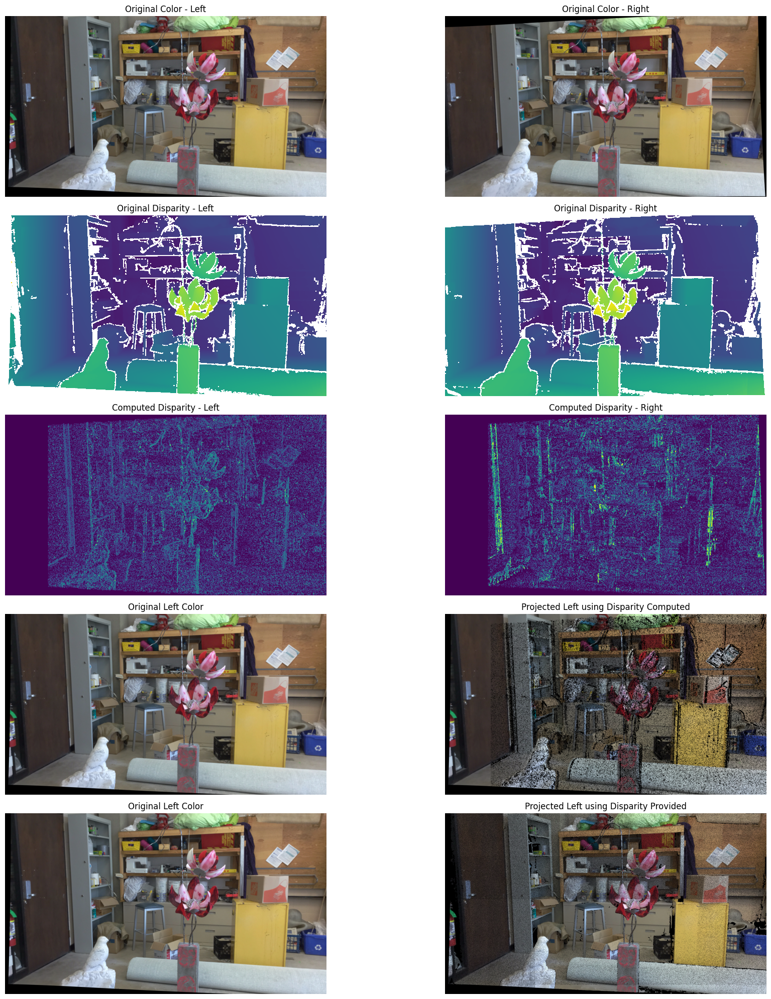

In [228]:
# Dense Reconstruction for "artroom1"
im0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/artroom1/im0.png'
im1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/artroom1/im1.png'
disp0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/artroom1/disp0.pfm'
disp1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/artroom1/disp1.pfm'
calib_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/artroom1/calib.txt'

left_img, right_img, K, baseline, f, (cx, cy) = load_images_and_calibration(im0_path, im1_path, calib_path)
disparity_left, disparity_right = compute_and_display_disparity(left_img, right_img)
points3D, Q = rectify_and_reproject(left_img, right_img, K, baseline)
write_ply('artroom1_point_cloud.ply', points3D, left_img)
projected_image = reproject_and_draw_points(im0_path, points3D, baseline, K)

points3D_2 = cv2.reprojectImageTo3D(cv2.imread(disp0_path, cv2.IMREAD_UNCHANGED), Q)
write_ply('artroom1_point_cloud2.ply', points3D_2, left_img)
projected_image2 = process_and_project_3d_points(disp0_path, im0_path, Q, K)
visualize_images(im0_path, im1_path, disp0_path, disp1_path, disparity_left, disparity_right, projected_image, projected_image2)

K: [[1.75823e+03 0.00000e+00 9.53340e+02]
 [0.00000e+00 1.75823e+03 5.52290e+02]
 [0.00000e+00 0.00000e+00 1.00000e+00]]
Baseline: 111.53
Focal length: 1758.23
Principal point: (953.34, 552.29)


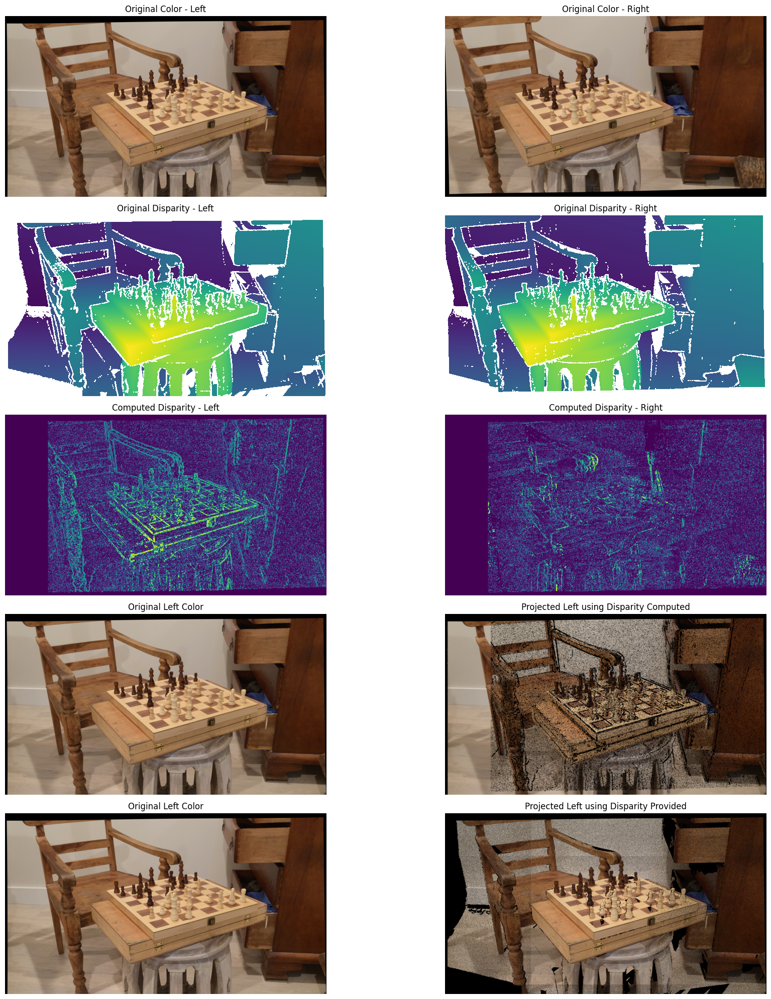

In [229]:
# Dense Reconstruction for "chess1"
im0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/chess1/im0.png'
im1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/chess1/im1.png'
disp0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/chess1/disp0.pfm'
disp1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/chess1/disp1.pfm'
calib_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/chess1/calib.txt'

left_img, right_img, K, baseline, f, (cx, cy) = load_images_and_calibration(im0_path, im1_path, calib_path)
disparity_left, disparity_right = compute_and_display_disparity(left_img, right_img)
points3D, Q = rectify_and_reproject(left_img, right_img, K, baseline)
write_ply('chess1_point_cloud.ply', points3D, left_img)
projected_image = reproject_and_draw_points(im0_path, points3D, baseline, K)

points3D_2 = cv2.reprojectImageTo3D(cv2.imread(disp0_path, cv2.IMREAD_UNCHANGED), Q)
write_ply('chess1_point_cloud2.ply', points3D_2, left_img)
projected_image2 = process_and_project_3d_points(disp0_path, im0_path, Q, K)
visualize_images(im0_path, im1_path, disp0_path, disp1_path, disparity_left, disparity_right, projected_image, projected_image2)

K: [[1.74624e+03 0.00000e+00 1.48800e+01]
 [0.00000e+00 1.74624e+03 5.34110e+02]
 [0.00000e+00 0.00000e+00 1.00000e+00]]
Baseline: 678.37
Focal length: 1746.24
Principal point: (14.88, 534.11)


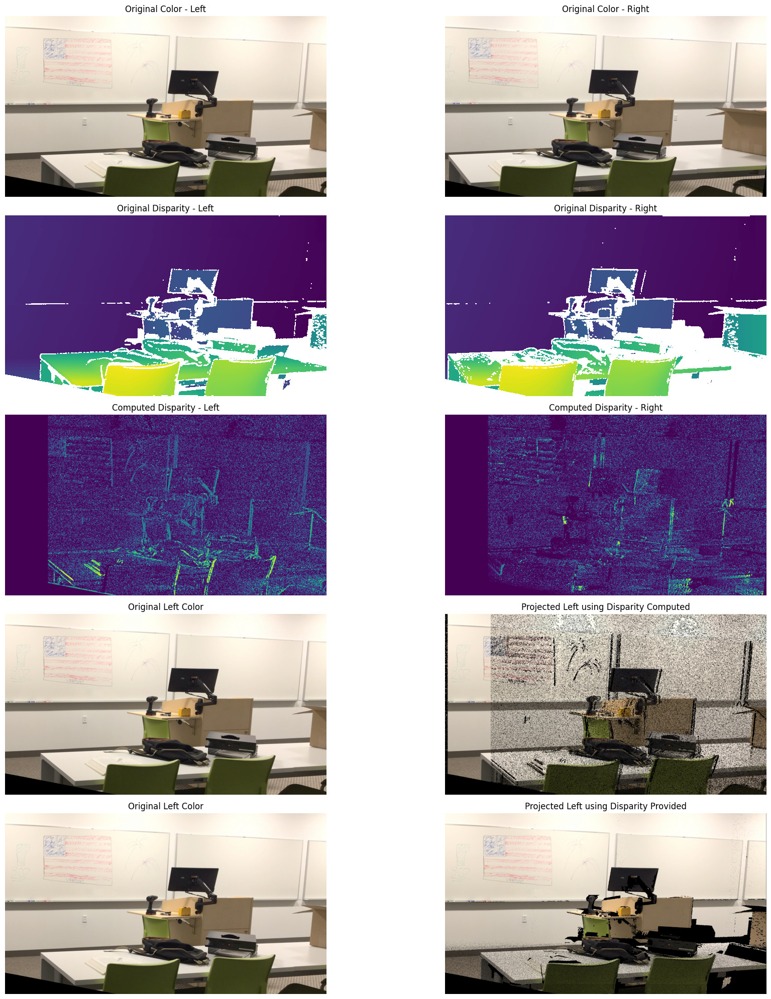

In [230]:
# Dense Reconstruction for "podium1"
im0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/podium1/im0.png'
im1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/podium1/im1.png'
disp0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/podium1/disp0.pfm'
disp1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/podium1/disp1.pfm'
calib_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/podium1/calib.txt'

left_img, right_img, K, baseline, f, (cx, cy) = load_images_and_calibration(im0_path, im1_path, calib_path)
disparity_left, disparity_right = compute_and_display_disparity(left_img, right_img)
points3D, Q = rectify_and_reproject(left_img, right_img, K, baseline)
write_ply('podium1_point_cloud.ply', points3D, left_img)
projected_image = reproject_and_draw_points(im0_path, points3D, baseline, K)

points3D_2 = cv2.reprojectImageTo3D(cv2.imread(disp0_path, cv2.IMREAD_UNCHANGED), Q)
write_ply('podium1_point_cloud2.ply', points3D_2, left_img)
projected_image2 = process_and_project_3d_points(disp0_path, im0_path, Q, K)
visualize_images(im0_path, im1_path, disp0_path, disp1_path, disparity_left, disparity_right, projected_image, projected_image2)

K: [[1.72948e+03 0.00000e+00 8.00770e+02]
 [0.00000e+00 1.72948e+03 5.51550e+02]
 [0.00000e+00 0.00000e+00 1.00000e+00]]
Baseline: 532.81
Focal length: 1729.48
Principal point: (800.77, 551.55)


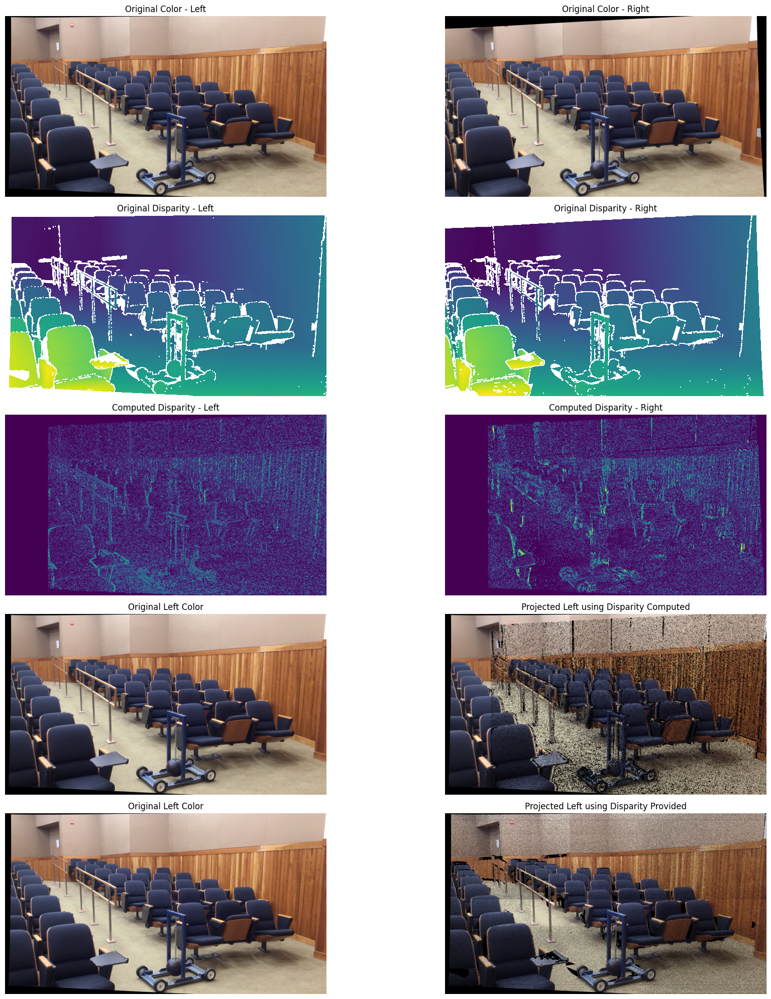

In [231]:
# Dense Reconstruction for "pendulum1"
im0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/pendulum1/im0.png'
im1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/pendulum1/im1.png'
disp0_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/pendulum1/disp0.pfm'
disp1_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/pendulum1/disp1.pfm'
calib_path = '/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/assignment-5-data/pendulum1/calib.txt'

left_img, right_img, K, baseline, f, (cx, cy) = load_images_and_calibration(im0_path, im1_path, calib_path)
disparity_left, disparity_right = compute_and_display_disparity(left_img, right_img)
points3D, Q = rectify_and_reproject(left_img, right_img, K, baseline)
write_ply('pendulum1_point_cloud.ply', points3D, left_img)
projected_image = reproject_and_draw_points(im0_path, points3D, baseline, K)

points3D_2 = cv2.reprojectImageTo3D(cv2.imread(disp0_path, cv2.IMREAD_UNCHANGED), Q)
write_ply('pendulum1_point_cloud2.ply', points3D_2, left_img)
projected_image2 = process_and_project_3d_points(disp0_path, im0_path, Q, K)
visualize_images(im0_path, im1_path, disp0_path, disp1_path, disparity_left, disparity_right, projected_image, projected_image2)

#Submission Instructions



1.   Complete all tasks above
2.   Export this notebook as .ipynb
      (File > Download as ipynb)
3.   Upload the .ipynb file on Blackboard - **file MUST contain the output for ALL cells**
4.   Submission **MUST** also contain ALL the .ply files generated = 2 per stereo pair = 8 total


##Rubric

* (80 points) Stereo Rectification & Sparse Reconstruction
* (70 points) Dense Stereo Reconstruction